# Data Augmentation in Deep Learning

In [2]:
pip install git+https://github.com/tensorflow/docs
# or
# pip install tensorflow_docs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-j7cdj982
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-j7cdj982
  Resolved https://github.com/tensorflow/docs to commit 3ad57a2dd8c8878c47e6e7e7cdfbe43d3c528d34
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=183273 sha256=21c812a4458a6e977893e99d8bcaa2083de7288bf4b70de348ffa2e9d4cbd6ee
  Stored in directory: /tmp/pip-ephem-wheel-cache-z7ax45t7/wheels/fc/f8/3b/5d21409a59cb1be9b1ade11f682039ced75b84de9dd6a0c8de
Successfully built tensorflow-docs


In [3]:
import urllib

import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import layers
AUTOTUNE = tf.data.experimental.AUTOTUNE

import tensorflow_docs as tfdocs
import tensorflow_docs.plots

import tensorflow_datasets as tfds

import PIL.Image

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 5)

import numpy as np

## Download Image

2125399/2125399 [==============================] - 1s 0us/step


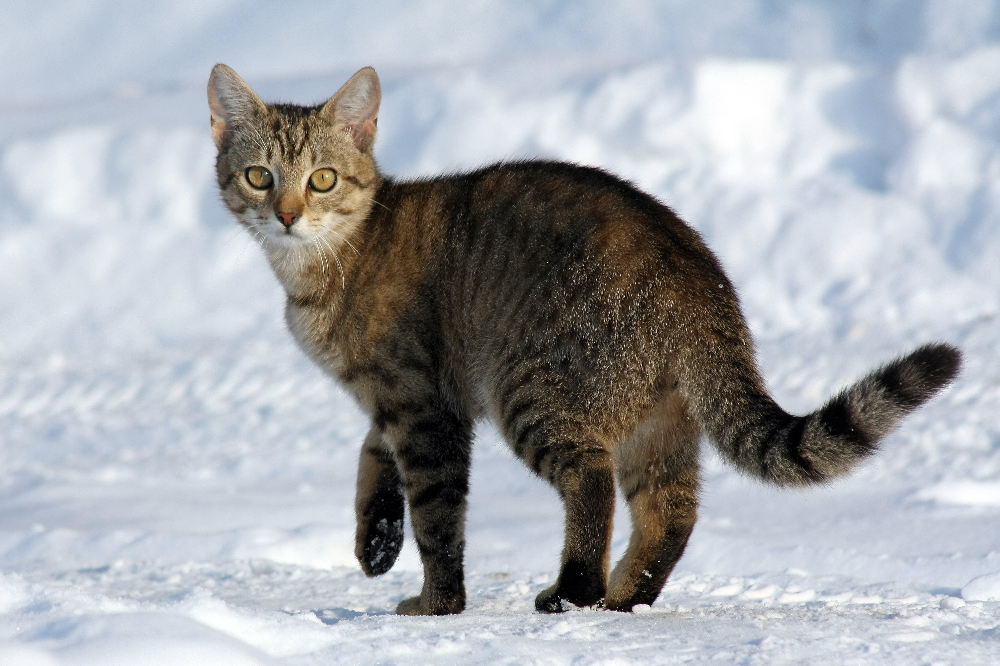

In [9]:
image_path = tf.keras.utils.get_file("cat.jpg" , origin= "https://upload.wikimedia.org/wikipedia/commons/b/b6/Felis_catus-cat_on_snow.jpg" , extract=True)
PIL.Image.open(image_path)

In [10]:
image_string=tf.io.read_file(image_path)
image=tf.image.decode_jpeg(image_string,channels=3)

In [11]:
def visualize(original, augmented):
  fig = plt.figure()
  plt.subplot(1,2,1)
  plt.title('Original image')
  plt.imshow(original)

  plt.subplot(1,2,2)
  plt.title('Augmented image')
  plt.imshow(augmented)

## Data Augmentation on a Single Image

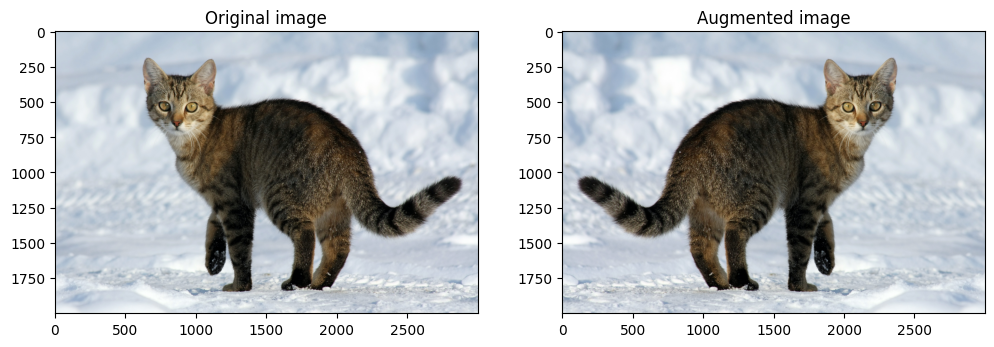

In [12]:
flipped = tf.image.flip_left_right(image)
visualize(image, flipped)

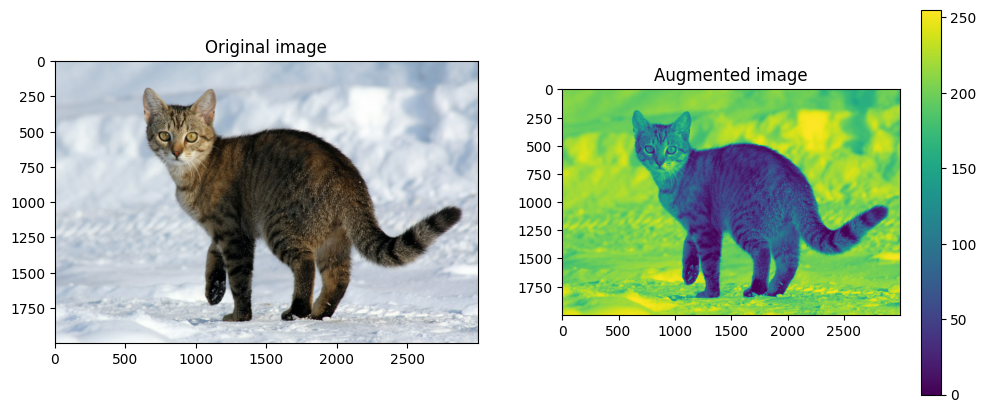

In [13]:
grayscaled = tf.image.rgb_to_grayscale(image)
visualize(image, tf.squeeze(grayscaled))
plt.colorbar()

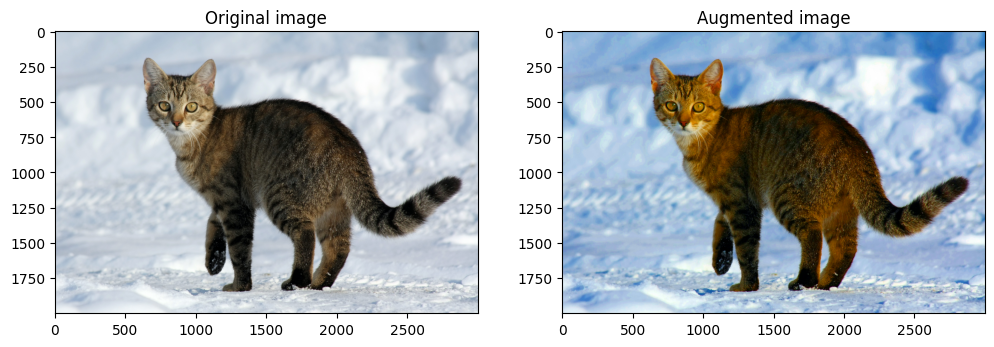

In [14]:
saturated = tf.image.adjust_saturation(image, 3)
visualize(image, saturated)

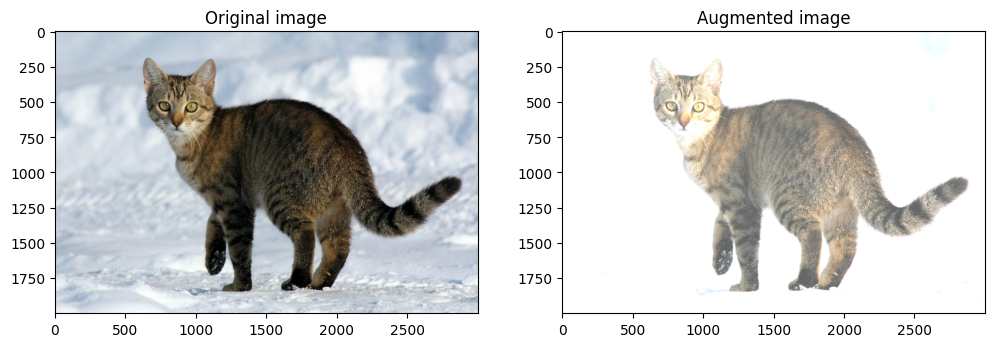

In [15]:
bright = tf.image.adjust_brightness(image, 0.4)
visualize(image, bright)

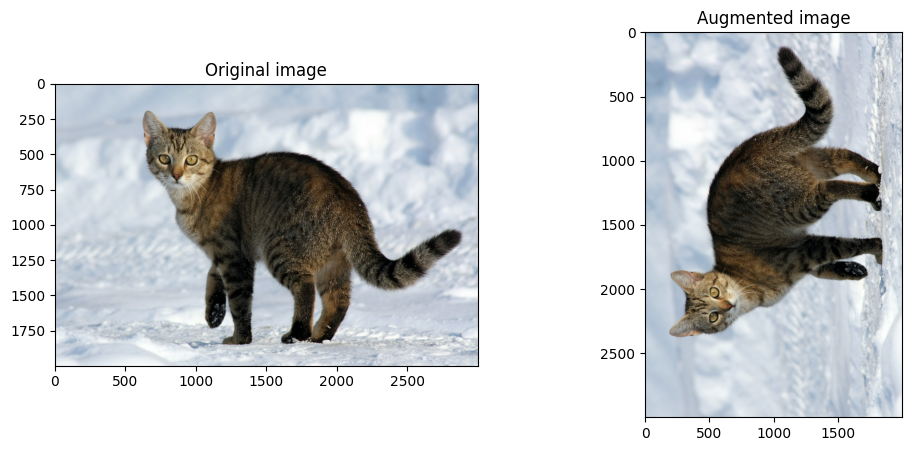

In [16]:
rotated = tf.image.rot90(image)
visualize(image, rotated)

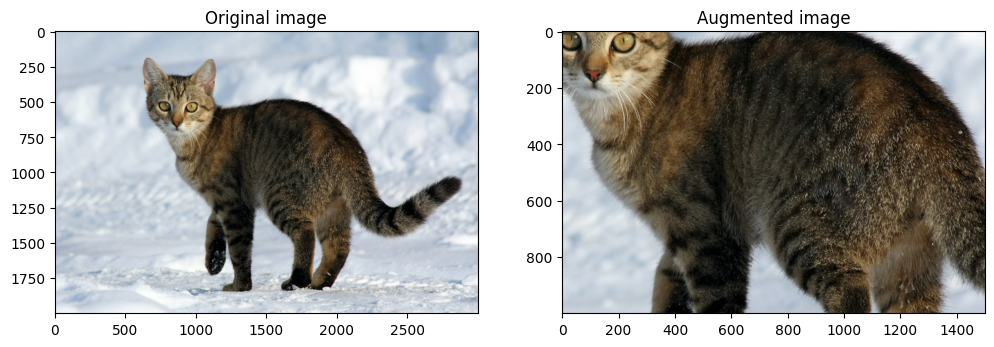

In [17]:
cropped = tf.image.central_crop(image, central_fraction=0.5)
visualize(image,cropped)

## Data Augmentation on a Dataset and Training a Model

In [18]:
dataset, info =  tfds.load('mnist', as_supervised=True, with_info=True)
train_dataset, test_dataset = dataset['train'], dataset['test']

num_train_examples= info.splits['train'].num_examples

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


In [19]:
def convert(image, label):
  image = tf.image.convert_image_dtype(image, tf.float32) # Cast and normalize the image to [0,1]
  return image, label

def augment(image,label):
  image,label = convert(image, label)
  image = tf.image.convert_image_dtype(image, tf.float32) # Cast and normalize the image to [0,1]
  image = tf.image.resize_with_crop_or_pad(image, 34, 34) # Add 6 pixels of padding
  image = tf.image.random_crop(image, size=[28, 28, 1]) # Random crop back to 28x28
  image = tf.image.random_brightness(image, max_delta=0.5) # Random brightness

  return image,label
BATCH_SIZE = 64
# Only use a subset of the data so it's easier to overfit, for this tutorial
NUM_EXAMPLES = 2048

In [20]:
augmented_train_batches = (
    train_dataset
    # Only train on a subset, so you can quickly see the effect.
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples//4)
    # The augmentation is added here.
    .map(augment, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [21]:
non_augmented_train_batches = (
    train_dataset
    # Only train on a subset, so you can quickly see the effect.
    .take(NUM_EXAMPLES)
    .cache()
    .shuffle(num_train_examples//4)
    # No augmentation.
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
) 

In [22]:
validation_batches = (
    test_dataset
    .map(convert, num_parallel_calls=AUTOTUNE)
    .batch(2*BATCH_SIZE)
)

In [23]:
def make_model():
  model = tf.keras.Sequential([
      layers.Flatten(input_shape=(28, 28, 1)),
      layers.Dense(4096, activation='relu'),
      layers.Dense(4096, activation='relu'),
      layers.Dense(10)
  ])
  model.compile(optimizer = 'adam',
                loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics=['accuracy'])
  return model

## Training the Model

In [24]:
model_without_aug = make_model()

no_aug_history = model_without_aug.fit(non_augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 36s 1s/step - loss: 0.8338 - accuracy: 0.7529 - val_loss: 0.3463 - val_accuracy: 0.9004
Epoch 2/50
32/32 [==============================] - 24s 764ms/step - loss: 0.1952 - accuracy: 0.9355 - val_loss: 0.2892 - val_accuracy: 0.9149
Epoch 3/50
32/32 [==============================] - 37s 1s/step - loss: 0.0918 - accuracy: 0.9756 - val_loss: 0.2566 - val_accuracy: 0.9291
Epoch 4/50
32/32 [==============================] - 35s 1s/step - loss: 0.0409 - accuracy: 0.9854 - val_loss: 0.3016 - val_accuracy: 0.9251
Epoch 5/50
32/32 [==============================] - 28s 880ms/step - loss: 0.0225 - accuracy: 0.9922 - val_loss: 0.3296 - val_accuracy: 0.9267
Epoch 6/50
32/32 [==============================] - 26s 840ms/step - loss: 0.0186 - accuracy: 0.9956 - val_loss: 0.4283 - val_accuracy: 0.9097
Epoch 7/50
32/32 [==============================] - 29s 932ms/step - loss: 0.0220 - accuracy: 0.9927 - val_loss: 0.4168 - val_accuracy: 0.9146
Epoch 8/

In [25]:
model_with_aug = make_model()

aug_history = model_with_aug.fit(augmented_train_batches, epochs=50, validation_data=validation_batches)

Epoch 1/50
32/32 [==============================] - 36s 1s/step - loss: 2.4369 - accuracy: 0.2715 - val_loss: 1.2422 - val_accuracy: 0.6079
Epoch 2/50
32/32 [==============================] - 23s 735ms/step - loss: 1.3891 - accuracy: 0.5283 - val_loss: 0.7906 - val_accuracy: 0.7355
Epoch 3/50
32/32 [==============================] - 35s 1s/step - loss: 1.0512 - accuracy: 0.6597 - val_loss: 0.6382 - val_accuracy: 0.8008
Epoch 4/50
32/32 [==============================] - 24s 775ms/step - loss: 0.7630 - accuracy: 0.7456 - val_loss: 0.4059 - val_accuracy: 0.8770
Epoch 5/50
32/32 [==============================] - 35s 1s/step - loss: 0.6512 - accuracy: 0.7778 - val_loss: 0.3880 - val_accuracy: 0.8771
Epoch 6/50
32/32 [==============================] - 35s 1s/step - loss: 0.6149 - accuracy: 0.7881 - val_loss: 0.3236 - val_accuracy: 0.8963
Epoch 7/50
32/32 [==============================] - 35s 1s/step - loss: 0.5771 - accuracy: 0.8101 - val_loss: 0.2888 - val_accuracy: 0.9107
Epoch 8/50
32/

(0.75, 1.0)

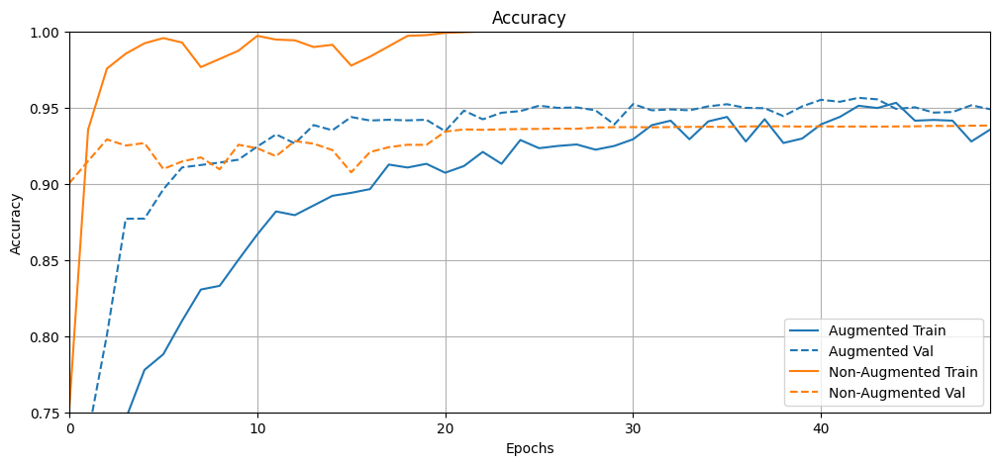

In [26]:
plotter = tfdocs.plots.HistoryPlotter()
plotter.plot({"Augmented": aug_history, "Non-Augmented": no_aug_history}, metric = "accuracy")
plt.title("Accuracy")
plt.ylim([0.75,1])